### Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. 
Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

#### Изучение исходных данных

In [1]:
!pip install folium -U

In [2]:
import pandas as pd
import numpy as np
import scipy.stats as st
import math as mth
from datetime import date, datetime, timedelta
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
pd.options.display.max_colwidth = 150

In [3]:
data = pd.read_csv('/Users/HP/Downloads/moscow_places.csv')

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


#### Вывод

Исходный датасет содержит информацию о 8406 заведениях. Тип данных соответствует значениям в столбцах. В ряде столбцов есть пропуски рассмотрим их подробней в следующем разделе.

#### Предобработка данных 

##### Дубликаты

In [5]:
print('Количество явных дубликатов: ', data.duplicated().sum())

Количество явных дубликатов:  0


Проверим неявные дубликаты.

In [6]:
#Приведем весь столбец name к нижнему регистру
data['name'] = data['name'].str.lower()
#Заменим все "ё" на "е"
data['name'] = data['name'].str.replace('ё', 'е')
#Проверим по столбцам name и address
print('Количество дубликатов: ', data.duplicated(subset=['name','address','lat']).sum())
data_duplicated = data[data.duplicated(subset=['name','address','lat'],keep=False)]
data_duplicated

Количество дубликатов:  1


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


Выявлен одни дубликат. Удалим его.

In [7]:
data.drop_duplicates(subset=['name','address','lat'],keep=False, inplace=True)

In [8]:
print('Количество дубликатов: ', data.duplicated(subset=['name','address','lat']).sum())

Количество дубликатов:  0


##### Пропуски

In [9]:
print(data.isna().sum())
pd.DataFrame(round(data.isna().mean()*100,)).style.background_gradient('coolwarm')

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5089
avg_bill             4588
middle_avg_bill      5255
middle_coffee_cup    7869
chain                   0
seats                3611
dtype: int64


,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


Основное количество пропусков в столбцах со средними чеками и в столбце seats (количество посадочных мест). Заполнять столбцыми со средними чеками мелдианой или средним значением будет некорректно, потому что средний чек каждого заведения зависит от многих факторов (расположение, категория заведения, количество посадочных мест и тд). А удаление такого значительного количества пропусков исказит данные. Поэтому оставляем все пропуски.

Создадим столбец `street` с названиями улиц из столбца с адресом.

In [10]:
data['street'] = data['address'].str.split(', ').str[1]

Создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение `True` — если заведение работает ежедневно и круглосуточно;
- логическое значение `False` — в противоположном случае.

In [11]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

#### Вывод

* Данные проверены на отсутствие дубликатов.
* Проанализированы пропуски. Принято решение оставить их.
* Созданы столбцы с названием улицы и с обозначением ежедневного круглосуточного режима работы заведения.

#### Анализ данных

###### Категории заведений в исходных данных

In [12]:
category_name = data.groupby('category')['name'].count().reset_index().sort_values('name',ascending=False)

category_name

,category,name
3,кафе,2378
6,ресторан,2041
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


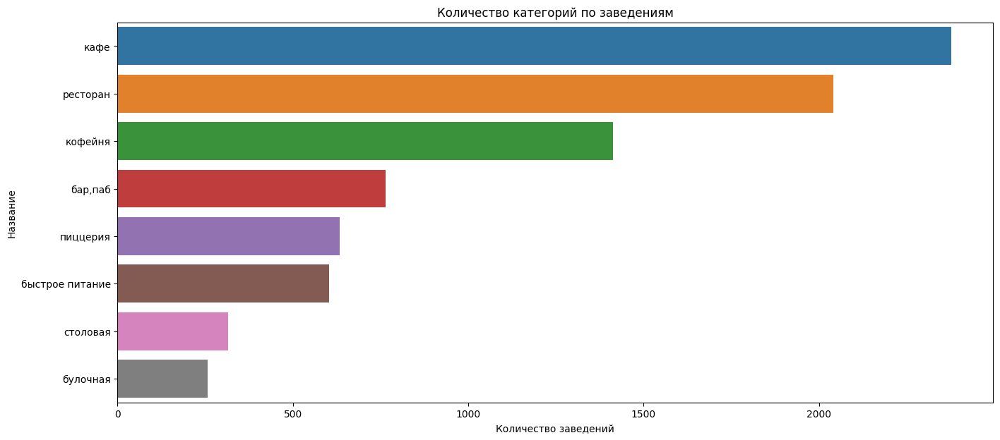

In [13]:
ax = plt.subplots(figsize=(16, 7))
ax = sns.barplot(x='name', y='category', data=category_name)
plt.title('Количество категорий по заведениям')
plt.xlabel('Количество заведений')
plt.ylabel('Название')
plt.show()

Больше половины заведений это кафе и рестораны, меньше всего столовых и булочных.

##### Количество посадочных мест по категориям заведений

In [14]:
data.groupby('category')['seats'].describe()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",468.0,124.532051,145.011574,0.0,48.00,82.5,150.0,1288.0
булочная,148.0,89.385135,97.685844,0.0,25.00,50.0,120.0,625.0
быстрое питание,349.0,98.891117,106.611739,0.0,28.00,65.0,140.0,1040.0
кафе,1218.0,97.512315,117.985084,0.0,35.25,60.0,120.0,1288.0
кофейня,751.0,111.199734,127.837772,0.0,40.00,80.0,144.0,1288.0
пиццерия,427.0,94.496487,112.282703,0.0,30.00,55.0,120.0,1288.0
ресторан,1268.0,121.839905,123.827121,0.0,48.00,86.0,150.0,1288.0
столовая,164.0,99.750000,122.951453,0.0,40.00,75.5,117.0,1200.0


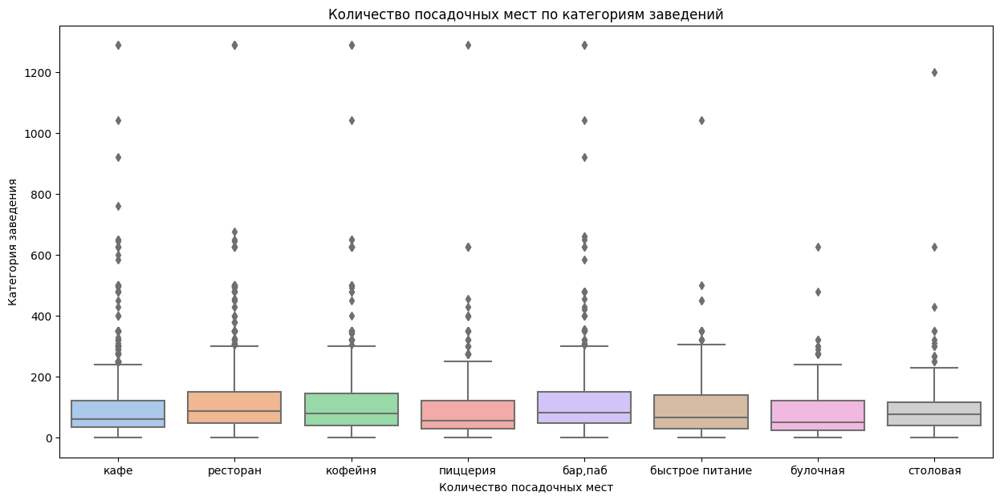

In [15]:
plt.figure(figsize=(15, 7))
sns.color_palette("tab10")
ax = sns.boxplot(x='category', y='seats', data=data, palette="pastel")
plt.title('Количество посадочных мест по категориям заведений')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория заведения')
plt.show()

Видим, что в количестве посадочных мест есть аномально большие значения, которые нужно отсечь. Определимся с границей, рассчитав  99й перцентили.

In [16]:
print(np.nanpercentile(data['seats'], [99]))

[625.]


Значения больше 500 примем за аномальные и отсечем. И еще раз посмотрим на график с новыми данными.

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8404 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8404 non-null   object 
 1   category           8404 non-null   object 
 2   address            8404 non-null   object 
 3   district           8404 non-null   object 
 4   hours              7868 non-null   object 
 5   lat                8404 non-null   float64
 6   lng                8404 non-null   float64
 7   rating             8404 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8404 non-null   int64  
 13  seats              4793 non-null   float64
 14  street             8404 non-null   object 
 15  is_24/7            7868 non-null   object 
dtypes: float64(6), int64(1),

In [18]:
data = data.query('seats <= 500 | seats.isna()')

print(data.groupby('category')['seats'].describe().round(2))

                  count    mean    std  min    25%   50%     75%    max
category                                                               
бар,паб           458.0  109.04  93.20  0.0  47.25  80.0  140.00  480.0
булочная          147.0   85.74  87.35  0.0  25.00  50.0  120.00  478.0
быстрое питание   348.0   96.19  94.02  0.0  27.25  65.0  136.25  500.0
кафе             1204.0   89.57  88.93  0.0  35.00  60.0  106.00  500.0
кофейня           739.0  100.43  90.99  0.0  40.00  78.0  140.00  500.0
пиццерия          423.0   87.91  85.48  0.0  30.00  52.0  120.00  455.0
ресторан         1256.0  114.85  96.98  0.0  48.00  85.5  150.00  500.0
столовая          162.0   89.72  77.27  0.0  40.00  75.0  115.00  428.0


In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8348 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8348 non-null   object 
 1   category           8348 non-null   object 
 2   address            8348 non-null   object 
 3   district           8348 non-null   object 
 4   hours              7819 non-null   object 
 5   lat                8348 non-null   float64
 6   lng                8348 non-null   float64
 7   rating             8348 non-null   float64
 8   price              3294 non-null   object 
 9   avg_bill           3792 non-null   object 
 10  middle_avg_bill    3131 non-null   float64
 11  middle_coffee_cup  529 non-null    float64
 12  chain              8348 non-null   int64  
 13  seats              4737 non-null   float64
 14  street             8348 non-null   object 
 15  is_24/7            7819 non-null   object 
dtypes: float64(6), int64(1),

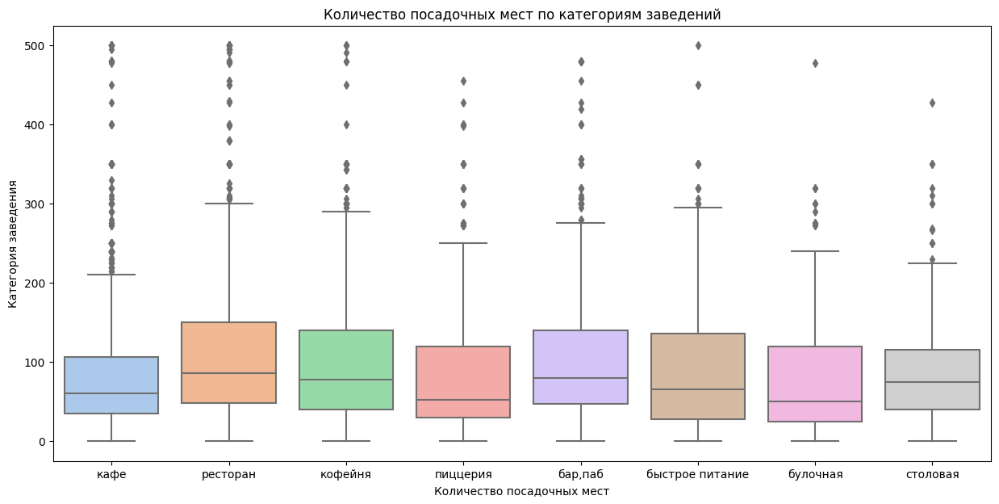

In [20]:
plt.figure(figsize=(15, 7))
sns.color_palette("tab10")
ax = sns.boxplot(x='category', y='seats', data=data, palette="pastel")
plt.title('Количество посадочных мест по категориям заведений')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория заведения')
plt.show()

Больше всего посадочных мест в ресторанах, барах/пабах и кофейнях.

##### Соотношение сетевых и несетевых заведений

chain
0    5170
1    3178
Name: name, dtype: int64


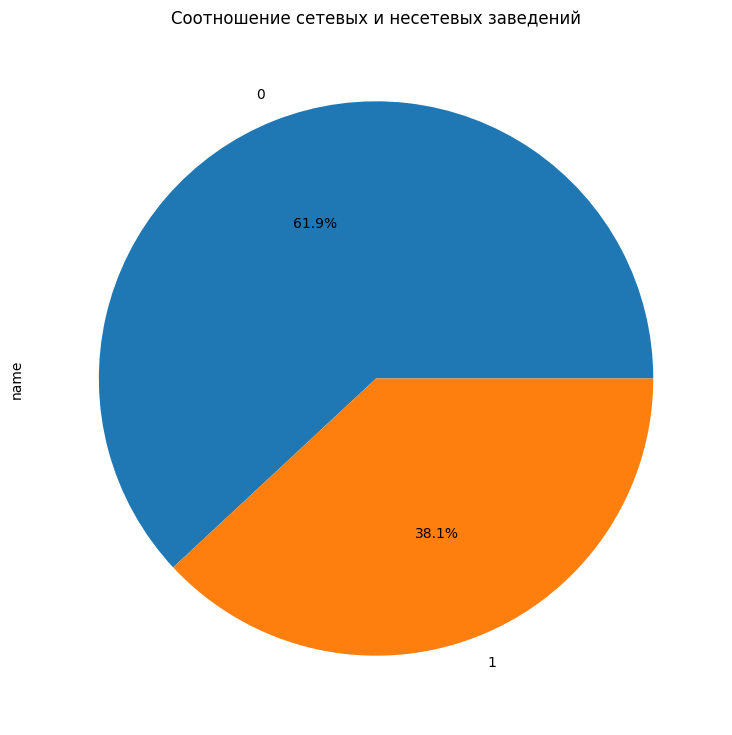

In [21]:
chain_name = data.groupby('chain')['name'].count().sort_values(ascending=False)
print(chain_name)
chain_name.plot(kind='pie', y='count', figsize=(9,9), title='Соотношение сетевых и несетевых заведений', autopct='%1.1f%%')
plt.show()

Несетевых заведений почти на 24% больше.

##### Какие категории заведений чаще являются сетевыми

In [22]:
chain_category = data.pivot_table(index='category',columns='chain', values='name', aggfunc= 'count').reset_index()
chain_category.columns = ['category','no_chains', 'chains']
chain_category['count'] = chain_category['no_chains'] + chain_category['chains']
chain_category['chains%'] = chain_category['chains']*100/chain_category['count'] 
chain_category = chain_category.sort_values(by='chains%', ascending=False)
chain_category 

,category,no_chains,chains,count,chains%
1,булочная,99,156,255,61.176471
5,пиццерия,301,328,629,52.146264
4,кофейня,688,713,1401,50.892220
2,быстрое питание,371,231,602,38.372093
6,ресторан,1308,721,2029,35.534746
3,кафе,1590,774,2364,32.741117
7,столовая,226,87,313,27.795527
0,"бар,паб",587,168,755,22.251656


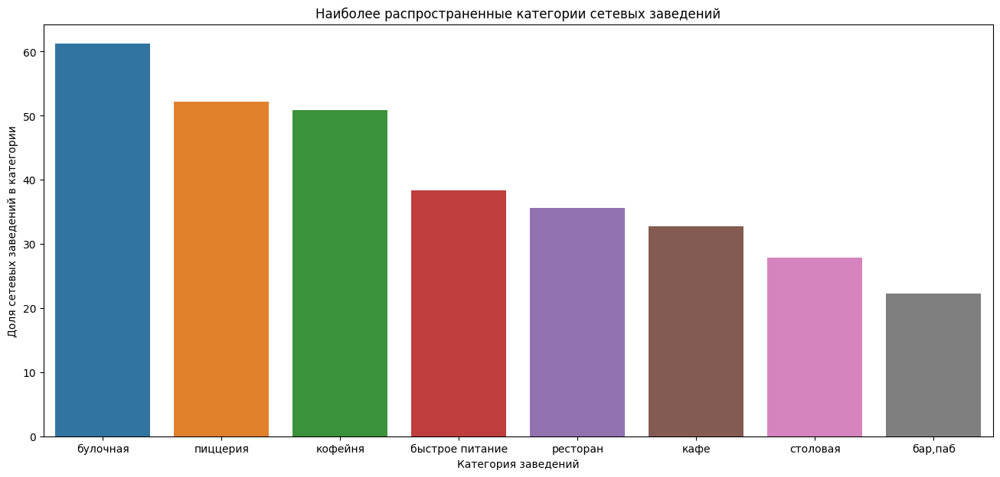

In [23]:
ax = plt.subplots(figsize=(16, 7))
ax = sns.barplot(x='category', y='chains%', data=chain_category)
plt.title('Наиболее распространенные категории сетевых заведений')
plt.xlabel('Категория заведений')
plt.ylabel('Доля сетевых заведений в категории')
plt.show()

Сетевыми чаще являются булочные, пиццерии и кофейни.

##### Топ-15 популярных сетей в Москве

In [24]:
chain_name = data.query('chain == 1')
name_top15 = (
    chain_name.groupby('name').agg({'category' : pd.Series.mode, 'district':'count', 'middle_avg_bill':'median'})
    .reset_index().sort_values('district', ascending=False).iloc[0:15]
)
name_top15

,name,category,district,middle_avg_bill
730,шоколадница,кофейня,118,650.0
335,домино'с пицца,пиццерия,76,500.0
331,додо пицца,пиццерия,74,391.5
146,one price coffee,кофейня,70,NaN
743,яндекс лавка,ресторан,68,NaN
58,cofix,кофейня,65,NaN
168,prime,ресторан,50,300.0
665,хинкальная,кафе,44,1000.0
411,кофепорт,кофейня,42,NaN
629,теремок,ресторан,38,325.0


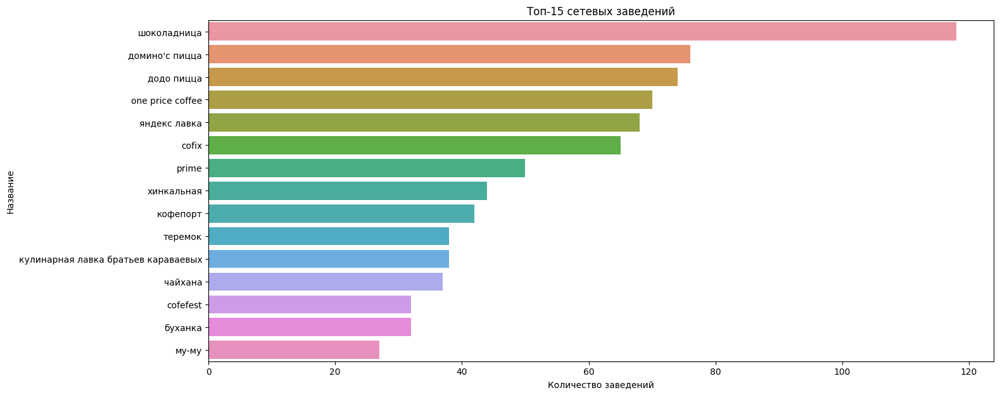

In [25]:
ax = plt.subplots(figsize=(16, 7))
ax = sns.barplot(x='district', y='name', data=name_top15)
plt.title('Топ-15 сетевых заведений')
plt.xlabel('Количество заведений')
plt.ylabel('Название')
plt.show()

Самые популярные сетевые заведения: Шоколадница (кофейня), Додо Пицца (пицерия) и Доминос Пицца (пицерия). Средний чек данных заведений не превышает 700 рублей.

##### Количество заведений по административным районам Москвы

Посмотрим общее количество заведений по районам.

In [26]:
district_name = data.groupby('district')['name'].count().reset_index()
district_name

,district,name
0,Восточный административный округ,789
1,Западный административный округ,831
2,Северный административный округ,875
3,Северо-Восточный административный округ,891
4,Северо-Западный административный округ,409
5,Центральный административный округ,2242
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,706
8,Южный административный округ,891


Количество заведений каждой категории по районам.

In [27]:
data.pivot_table(index='district', columns='category', values='name', aggfunc= 'count').reset_index()

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,49,25,70,269,104,72,160,40
1,Западный административный округ,46,37,62,234,146,70,213,23
2,Северный административный округ,66,38,58,231,186,74,182,40
3,Северо-Восточный административный округ,63,28,82,269,159,68,182,40
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18
5,Центральный административный округ,364,50,87,464,428,113,670,66
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25
7,Юго-Западный административный округ,38,27,61,236,96,64,167,17
8,Южный административный округ,68,25,85,264,131,73,201,44


In [28]:
district_category=(
    data.groupby(['district','category']).agg({'name':'count'}).reset_index().sort_values('name',ascending=True)
)

fig = px.bar(district_category,
             x='name',
             y='district',
             color='category'
            )
fig.update_layout(title = 'Количество заведений по категориям по районам',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название района',
)
fig.show()

В ЦАО заведений значительно больше, чем в других районах. Преобладают рестораны. Меньше всего заведений в СЗАО.

##### Распределение средних рейтингов по категориям заведений

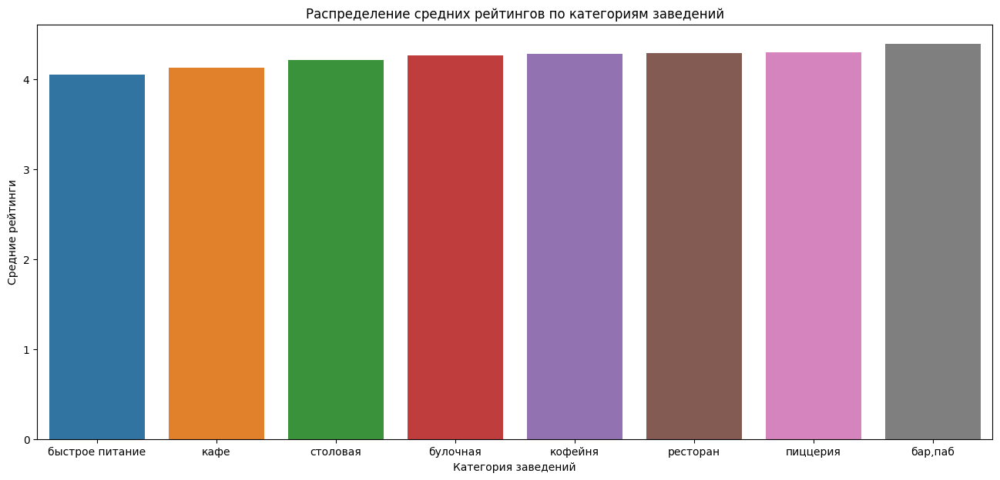

In [29]:
rating_category = data.groupby('category').agg({'rating':'mean'}).reset_index().sort_values('rating')

ax = plt.subplots(figsize=(16, 7))
ax = sns.barplot(x='category', y='rating', data=rating_category)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория заведений')
plt.ylabel('Средние рейтинги')
plt.show()

Средние рейтинги всех категорий отличаются незначительно и находятся в районе 4. При этом, самый высокий средний рейтинг у баров/пабов, самый низкий и заведений быстрого питания.

##### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [30]:
rating_data = data.groupby('district')['rating'].mean().reset_index().sort_values('rating',ascending=False)
rating_data

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239086
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184063
1,Западный административный округ,4.179904
0,Восточный административный округ,4.174271
7,Юго-Западный административный округ,4.172521
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


In [31]:
import json
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
#try:
 #   state_geo = '/datasets/admin_level_geomap.geojson'
#except:
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
    
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий средний рейтинг в ЦАО, самый низкий в ЮВАО. Но в целом средние рейтинги по районам примерно одинаковые.

##### Отобразим все заведения датасета на карте с помощью кластеров

In [32]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

##### Топ-15 улиц по количеству заведений

Определим топ-15 улиц.

In [33]:
street_top15=data.groupby('street').agg({'name':'count'}).reset_index().sort_values('name', ascending=False).iloc[0:15]
print(street_top15)

                      street  name
1090           проспект Мира   184
773        Профсоюзная улица   122
525       Ленинский проспект   107
1087    проспект Вернадского    97
373        Дмитровское шоссе    88
455          Каширское шоссе    77
298         Варшавское шоссе    76
523   Ленинградский проспект    72
524      Ленинградское шоссе    70
550                     МКАД    65
547         Люблинская улица    60
1154          улица Вавилова    55
517     Кутузовский проспект    53
781          Пятницкая улица    48
1309    улица Миклухо-Маклая    47


Определим количество заведений по категориям на каждой улице.

In [34]:
street_category=data.groupby(['street', 'category']).agg({'name':'count'}).reset_index()
print(street_category)

                        street  category  name
0     1-й Автозаводский проезд      кафе     1
1      1-й Балтийский переулок  ресторан     1
2        1-й Варшавский проезд      кафе     1
3      1-й Вешняковский проезд      кафе     1
4     1-й Волоколамский проезд      кафе     1
...                        ...       ...   ...
3815         шоссе Энтузиастов      кафе    10
3816         шоссе Энтузиастов   кофейня     7
3817         шоссе Энтузиастов  пиццерия     2
3818         шоссе Энтузиастов  ресторан     7
3819                       № 7      кафе     1

[3820 rows x 3 columns]


Посмотрим какие категории заведений на улицах из топ-15.

In [35]:
street_top15_category = street_category[street_category['street'].isin(street_top15['street'])].sort_values('name',ascending=False)
street_top15_category

,street,category,name
2859,проспект Мира,кафе,53
2862,проспект Мира,ресторан,45
1379,МКАД,кафе,45
2860,проспект Мира,кофейня,36
1988,Профсоюзная улица,кафе,35
...,...,...,...
1249,Кутузовский проспект,булочная,1
2842,проспект Вернадского,булочная,1
1382,МКАД,столовая,1
1364,Люблинская улица,пиццерия,1


In [36]:
fig = px.bar(street_top15_category,
             x='name',
             y='street',
             color='category'
            )
fig.update_layout(title = 'Количество заведений по категориям по топ-15 улицам',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Названия улиц',
)
fig.show()

Больше всего заведений на Профсоюзной улице и проспекте Мира. На этих улицах преобладают рестораны, кафе и кофейни.

##### Улицы, на которых находится только один объект общепита

In [37]:
streets1 = data.groupby('street').agg({'name':'count'}).reset_index().sort_values('name', ascending=True)

streets1 = streets1.query('name == 1')
print(streets1)

                          street  name
0       1-й Автозаводский проезд     1
683            Одинцовская улица     1
689         Октябрьский переулок     1
694              Ордынский тупик     1
695           Оренбургская улица     1
..                           ...   ...
102        2-я Пугачёвская улица     1
212            Бесединское шоссе     1
66      2-й Вышеславцев переулок     1
176  Андреевский пешеходный мост     1
103          2-я Рощинская улица     1

[458 rows x 2 columns]


Посмотрим в каких районах расположены эти улицы.

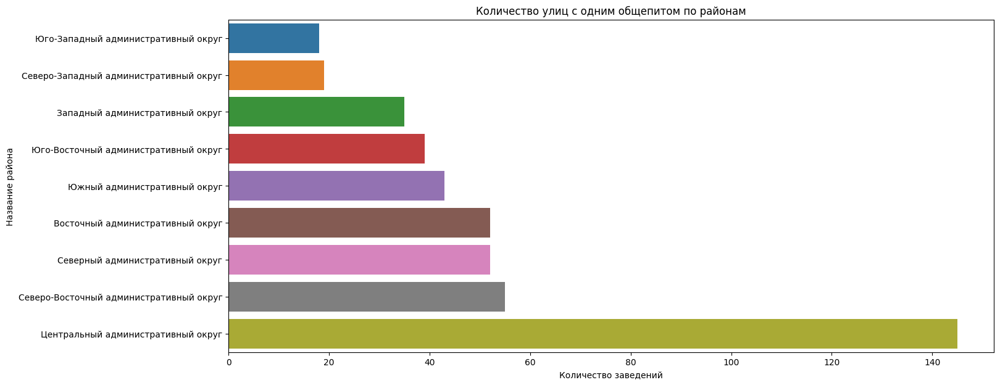

In [38]:
streets1_data = data[data['street'].isin(streets1['street'])]
streets1_district=streets1_data.groupby(['district']).agg({'street':'count'}).reset_index().sort_values('street')

ax = plt.subplots(figsize=(16, 7))
ax = sns.barplot(x='street', y='district', data=streets1_district)
plt.title('Количество улиц с одним общепитом по районам')
plt.xlabel('Количество заведений')
plt.ylabel('Название района')
plt.show()

Больше всего таких улиц в ЦАО, меньше всего в ЮЗАО.

##### Значения средних чеков заведений по районам

In [39]:
bill_district = (
    data.groupby(['district']).agg({'middle_avg_bill':'median'}).reset_index()
    .sort_values('middle_avg_bill',ascending=False)
)
bill_district

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [40]:
# создаём карту Москвы
mm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.5,
    legend_name='Средний чек по районам',
).add_to(mm)

# выводим карту
mm

Самый большой средний чек в ЗАО и ЦАО, самый маленький в СВАО, ЮВАО и ЮАО. Средний чек в ЦАО и ЗАО в 1,5-2 раза больше, чем в других округах.

#### Вывод

В ходе анализа данных установлено:
* Самые распространенные заведения - кафе и рестораны (более 50%), наименее распространенные - столовые и булочные (7%).
* Заведения с наибольшим количеством посадочных мест - рестораны, бары/пабы  и кофейни. В среднем 100-110 посадочных мест.
* Несетевых заведений почти на 24% больше, чем сетевых. Сетевыми чаще являются булочные, пиццерии и кофейни.
* Самое распространенное сетевое заведение - Шоколадница. На 2 и 3 месте Додо Пицца и Домино'с Пицца. Средний чек данных заведений не превышает 700 рублей.
* Район с наибольшим количеством заведений - ЦАО. Там заведений значительно больше, чем в других районах. Преобладают рестораны. Меньше всего заведений в СЗАО.
* Самый высокий средний рейтинг заведений в ЦАО (4.4), самый низкий в ЮВАО (4.1).
* Улицы с наибольшим количеством заведений: Профсоюзная и проспект Мира. На этих улицах преобладают рестораны, кафе и кофейни.
* Самый большой средний чек в ЗАО и ЦАО, самый маленький в СВАО, ЮВАО и ЮАО. Средний чек в ЦАО и ЗАО в 1,5-2 раза больше, чем в других округах.

#### Детализация исследования: открытие кофейни

##### Количество кофеен по районам

In [41]:
coffee = data.query('category == "кофейня"')
print('Общее количество кофеен: ', coffee['name'].count())

Общее количество кофеен:  1401


In [42]:
coffee_district = coffee.groupby('district')['category'].count().reset_index()
coffee_district['count'] = district_name['name']
coffee_district['ratio'] = round(coffee_district['category']*100/coffee_district['count'], 2)
coffee_district = coffee_district.sort_values('category', ascending=False)
coffee_district

,district,category,count,ratio
5,Центральный административный округ,428,2242,19.09
2,Северный административный округ,186,875,21.26
3,Северо-Восточный административный округ,159,891,17.85
1,Западный административный округ,146,831,17.57
8,Южный административный округ,131,891,14.70
0,Восточный административный округ,104,789,13.18
7,Юго-Западный административный округ,96,706,13.60
6,Юго-Восточный административный округ,89,714,12.46
4,Северо-Западный административный округ,62,409,15.16


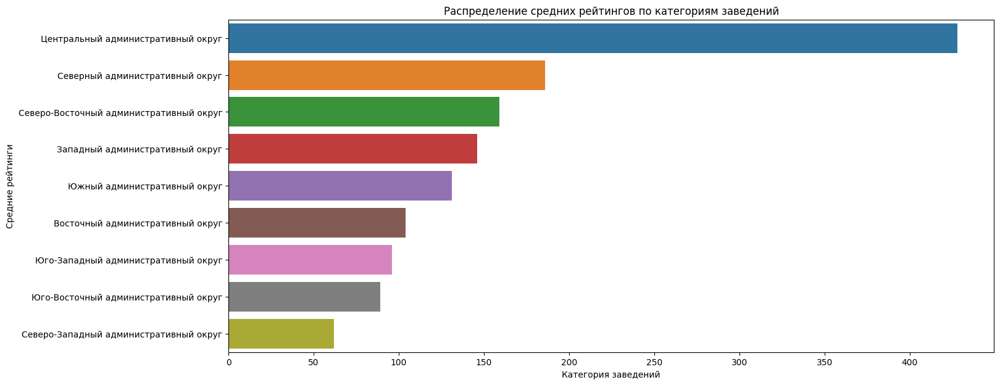

In [43]:
ax = plt.subplots(figsize=(16, 7))
ax = sns.barplot(x='category', y='district', data=coffee_district)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория заведений')
plt.ylabel('Средние рейтинги')
plt.show()

Больше всего кофеен в ЦАО и САО. При этом, относительно других заведений в районе больше всего их в ЗАО (18%) и в ЦАО (19%).

##### Режим работы кофеен

In [44]:
coffee.groupby('is_24/7')['name'].count()

is_24/7
False    1327
True       59
Name: name, dtype: int64

В данных 59 круглосуточных кофеен.

##### Рейтинги кофеен. Распределение по районам

In [45]:
coffee_rating = coffee.groupby('district')['rating'].mean().reset_index().sort_values('rating',ascending=False)
coffee_rating

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291935
0,Восточный административный округ,4.284615
7,Юго-Западный административный округ,4.283333
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.193151


In [46]:
# создаём карту Москвы
mmm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.5,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(mmm)

# выводим карту
mmm

Наиболее высокий средний рейтинг у кофеен в ЦАО и СЗАО, наиболее низкий - у кофеен в ЗАО.

##### Средняя стоимость чашки капучино

In [47]:
round(coffee['middle_coffee_cup'].mean(), 2)

175.06

Средняя стоимость чашки капучино в Москве 175.06 рублей.

Посмотрим среднюю стоимость по районам.

In [48]:
coffee_cup = coffee.groupby('district')['middle_coffee_cup'].median().reset_index().sort_values('middle_coffee_cup',ascending=False)
coffee_cup

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,187.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [49]:
# создаём карту Москвы
mmmm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.5,
    legend_name='Средняя стоимость чашки капучино',
).add_to(mmmm)

# выводим карту
mmmm

Средняя стоимость чашки капучино в Москве - 175.06 рублей, на неё и стоит ориентироваться при открытии. Самый дорогой кофе в ЮЗАО, далее по стоимости идут ЦАО и ЗАО.

#### Рекомендации для открытия новой кофейни

Для открытия новой кофейни можно порекомендовать район ЗАО. Там наибольшая доля кофеен относительно всех заведений в районе по сравнению с другими районами. Можно сделать вывод, что кофейни в этом районе пользуются популярностью. При этом, кофейни в ЗАО имеют невысокий рейтинг - проще будет составить конкуренцию. ЗАО второй район по стоимости чашки капучино (195 руб), соответственно можно попробовать навязать конкуренцию за счет более низкой цены на начальный период (к примеру акции в честь открытия). Можно ориентироваться на среднюю стоимость по Москве (179.87 руб).